In [1]:
!pip install -q -U bitsandbytes datasets pyarrow evaluate peft trl #transformers
!pip install -q -U git+https://github.com/huggingface/trl.git # For SFTTrainer

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.0/44.0 kB 3.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.1/59.1 MB 31.8 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 512.3/512.3 kB 31.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 47.7/47.7 MB 22.1 MB/s eta 0:00:0000:0100:01m
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.1/84.1 kB 5.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 556.4/556.4 kB 42.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 518.9/518.9 kB 39.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 5.1 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 122.0 MB/s eta 0:00:0000:010:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 93.4 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 55.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.8 MB/s 

In [2]:
# Install dependencies as needed:
# pip install kagglehub[pandas-datasets]
# import kagglehub
# from kagglehub import KaggleDatasetAdapter

import os
from os import listdir
import re
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt 
import plotly.express as px
import seaborn as sns

import cv2
from matplotlib.image import imread

import tensorflow as tf
# from keras.utils.np_utils import to_categorical
# from keras.preprocessing import image
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix

import evaluate
import glob
import PIL
from PIL import Image
import random

random.seed(420)

from datasets import Dataset, Image as HFImage, Features, ClassLabel, Value

from huggingface_hub import login
os.environ["HF_TOKEN"] = ""
login(token=os.environ["HF_TOKEN"])

!pip freeze | grep transformers

2025-12-21 09:48:58.395412: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1766310538.552834      47 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1766310538.596952      47 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

Note: Environment variable`HF_TOKEN` is set and is the current active token independently from the token you've just configured.


sentence-transformers==4.1.0
transformers==4.57.3


## Load and process the image paths for calcifications

In [3]:
dicom_data = pd.read_csv('/kaggle/input/cbis-ddsm-breast-cancer-image-dataset/csv/dicom_info.csv')

image_dir = '/kaggle/input/cbis-ddsm-breast-cancer-image-dataset/jpeg'
full_mammogram_images = dicom_data[dicom_data.SeriesDescription == 'full mammogram images'].image_path
cropped_images = dicom_data[dicom_data.SeriesDescription == 'cropped images'].image_path
roi_mask_images = dicom_data[dicom_data.SeriesDescription == 'ROI mask images'].image_path

full_mammogram_images = full_mammogram_images.apply(lambda x: x.replace('CBIS-DDSM/jpeg', image_dir))
cropped_images = cropped_images.apply(lambda x: x.replace('CBIS-DDSM/jpeg', image_dir))
roi_mask_images = roi_mask_images.apply(lambda x: x.replace('CBIS-DDSM/jpeg', image_dir))

full_mammogram_dict = dict()
cropped_dict = dict()
roi_mask_dict = dict()

for dicom in full_mammogram_images:
    key = dicom.split("/")[5]
    full_mammogram_dict[key] = dicom
for dicom in cropped_images:
    key = dicom.split("/")[5]
    cropped_dict[key] = dicom
for dicom in roi_mask_images:
    key = dicom.split("/")[5]
    roi_mask_dict[key] = dicom

next(iter((full_mammogram_dict.items())))

('1.3.6.1.4.1.9590.100.1.2.248386742010678582309005372213277814849',
 '/kaggle/input/cbis-ddsm-breast-cancer-image-dataset/jpeg/1.3.6.1.4.1.9590.100.1.2.248386742010678582309005372213277814849/1-249.jpg')

## Load train and test data for calcifications from CSV

In [4]:
calc_train_data_all = pd.read_csv('/kaggle/input/cbis-ddsm-breast-cancer-image-dataset/csv/calc_case_description_train_set.csv')
calc_train_data = calc_train_data_all[calc_train_data_all.pathology != "BENIGN_WITHOUT_CALLBACK"]
calc_train_data.columns = calc_train_data.columns.str.strip().str.replace(r'\s+', '_', regex=True)

calc_test_data_all = pd.read_csv('/kaggle/input/cbis-ddsm-breast-cancer-image-dataset/csv/calc_case_description_test_set.csv')
calc_test_data = calc_test_data_all[calc_test_data_all.pathology != "BENIGN_WITHOUT_CALLBACK"]
calc_test_data.columns = calc_test_data.columns.str.strip().str.replace(r'\s+', '_', regex=True)

print(f"calc train data all pathologies: {len(calc_train_data_all)}")
print(f"calc train data NO Callback: {len(calc_train_data)}")
print(f"calc test data all pathologies: {len(calc_test_data_all)}")
print(f"calc test data NO Callback: {len(calc_test_data)}")

calc train data all pathologies: 1546
calc train data NO Callback: 1072
calc test data all pathologies: 326
calc test data NO Callback: 259


In [11]:
calc_train_data

,patient_id,breast_density,left_or_right_breast,image_view,abnormality_id,abnormality_type,calc_type,calc_distribution,assessment,pathology,subtlety,image_file_path,cropped_image_file_path,ROI_mask_file_path
0,P_00005,3,RIGHT,CC,1,calcification,AMORPHOUS,CLUSTERED,3,MALIGNANT,3,/kaggle/input/cbis-ddsm-breast-cancer-image-da...,/kaggle/input/cbis-ddsm-breast-cancer-image-da...,/kaggle/input/cbis-ddsm-breast-cancer-image-da...
1,P_00005,3,RIGHT,MLO,1,calcification,AMORPHOUS,CLUSTERED,3,MALIGNANT,3,/kaggle/input/cbis-ddsm-breast-cancer-image-da...,/kaggle/input/cbis-ddsm-breast-cancer-image-da...,/kaggle/input/cbis-ddsm-breast-cancer-image-da...
2,P_00007,4,LEFT,CC,1,calcification,PLEOMORPHIC,LINEAR,4,BENIGN,4,/kaggle/input/cbis-ddsm-breast-cancer-image-da...,/kaggle/input/cbis-ddsm-breast-cancer-image-da...,/kaggle/input/cbis-ddsm-breast-cancer-image-da...
3,P_00007,4,LEFT,MLO,1,calcification,PLEOMORPHIC,LINEAR,4,BENIGN,4,/kaggle/input/cbis-ddsm-breast-cancer-image-da...,/kaggle/input/cbis-ddsm-breast-cancer-image-da...,/kaggle/input/cbis-ddsm-breast-cancer-image-da...
22,P_00011,3,LEFT,CC,1,calcification,PLEOMORPHIC,CLUSTERED,4,BENIGN,1,/kaggle/input/cbis-ddsm-breast-cancer-image-da...,/kaggle/input/cbis-ddsm-breast-cancer-image-da...,/kaggle/input/cbis-ddsm-breast-cancer-image-da...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1541,P_02566,2,RIGHT,MLO,1,calcification,AMORPHOUS-PLEOMORPHIC,SEGMENTAL,5,MALIGNANT,5,/kaggle/input/cbis-ddsm-breast-cancer-image-da...,/kaggle/input/cbis-ddsm-breast-cancer-image-da...,/kaggle/input/cbis-ddsm-breast-cancer-image-da...
1542,P_02572,2,LEFT,CC,1,calcification,AMORPHOUS,CLUSTERED,0,MALIGNANT,2,/kaggle/input/cbis-ddsm-breast-cancer-image-da...,/kaggle/input/cbis-ddsm-breast-cancer-image-da...,/kaggle/input/cbis-ddsm-breast-cancer-image-da...
1543,P_02572,2,LEFT,MLO,1,calcification,AMORPHOUS,CLUSTERED,0,MALIGNANT,2,/kaggle/input/cbis-ddsm-breast-cancer-image-da...,/kaggle/input/cbis-ddsm-breast-cancer-image-da...,/kaggle/input/cbis-ddsm-breast-cancer-image-da...
1544,P_02584,1,LEFT,CC,1,calcification,PLEOMORPHIC,SEGMENTAL,0,BENIGN,4,/kaggle/input/cbis-ddsm-breast-cancer-image-da...,/kaggle/input/cbis-ddsm-breast-cancer-image-da...,/kaggle/input/cbis-ddsm-breast-cancer-image-da...


## Create new categories so MedGemma sees more variablity in training data

In [5]:
calc_train_data["pathology"].value_counts()
# calc_train_data["calc_type"].value_counts()
# calc_train_data["calc_distribution"].value_counts()
# calc_train_data["assessment"].value_counts()
# calc_train_data["subtlety"].value_counts()


# #train
# calcification_type_counts = calc_train_data["calc_type"].value_counts()
# mask = (calcification_type_counts/calcification_type_counts.sum() * 100).lt(7)
# calc_train_data['calc_type_aggr'] = np.where(calc_train_data['calc_type'].isin(calcification_type_counts[mask].index),'Other',calc_train_data['calc_type'])

# calc_train_data["target_label"] = calc_train_data["pathology"]+'_'+calc_train_data["calc_type_aggr"] 
# calc_train_data["target_label"].value_counts()

# #test
# calcification_type_counts = calc_test_data["calc_type"].value_counts()
# mask = (calcification_type_counts/calcification_type_counts.sum() * 100).lt(7)
# calc_test_data['calc_type_aggr'] = np.where(calc_test_data['calc_type'].isin(calcification_type_counts[mask].index),'Other',calc_test_data['calc_type'])

# calc_test_data["target_label"] = calc_test_data["pathology"]+'_'+calc_test_data["calc_type_aggr"] 
# calc_test_data["target_label"].value_counts()

pathology
MALIGNANT    544
BENIGN       528
Name: count, dtype: int64

In [6]:
def fix_image_path_calc(dataset):

    for i, img in enumerate(dataset.values):
        img_name = img[11].split("/")[2]

        if img_name in full_mammogram_dict:
            dataset.iloc[i, 11] = full_mammogram_dict[img_name]

        img_name = img[12].split("/")[2]
        if img_name in cropped_dict:
            dataset.iloc[i, 12] = cropped_dict[img_name]
        
        img_name = img[13].split("/")[2]
        if img_name in roi_mask_dict:
            dataset.iloc[i, 13] = roi_mask_dict[img_name]

fix_image_path_calc(calc_train_data)
fix_image_path_calc(calc_test_data)

In [7]:
calc_test_data.calc_type.value_counts()
calc_test_data.pathology.value_counts()

pathology
BENIGN       130
MALIGNANT    129
Name: count, dtype: int64

## Visualize mammogram

BENIGN


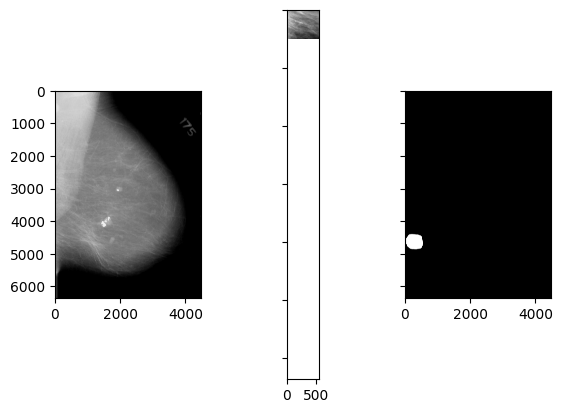

In [8]:
image_id = 1545
full = PIL.Image.open(calc_train_data["image_file_path"][image_id]).convert("L")

cropped = PIL.Image.open(calc_train_data["cropped_image_file_path"][image_id]).convert("L")

roi = PIL.Image.open(calc_train_data["ROI_mask_file_path"][image_id]).convert("L")

print(calc_train_data["pathology"][image_id])
f, (ax1, ax2, ax3) = plt.subplots(1, 3, sharey=True)
ax1.imshow(full, cmap='gray')
ax2.imshow(cropped, cmap='gray')
ax3.imshow(roi, cmap='gray')

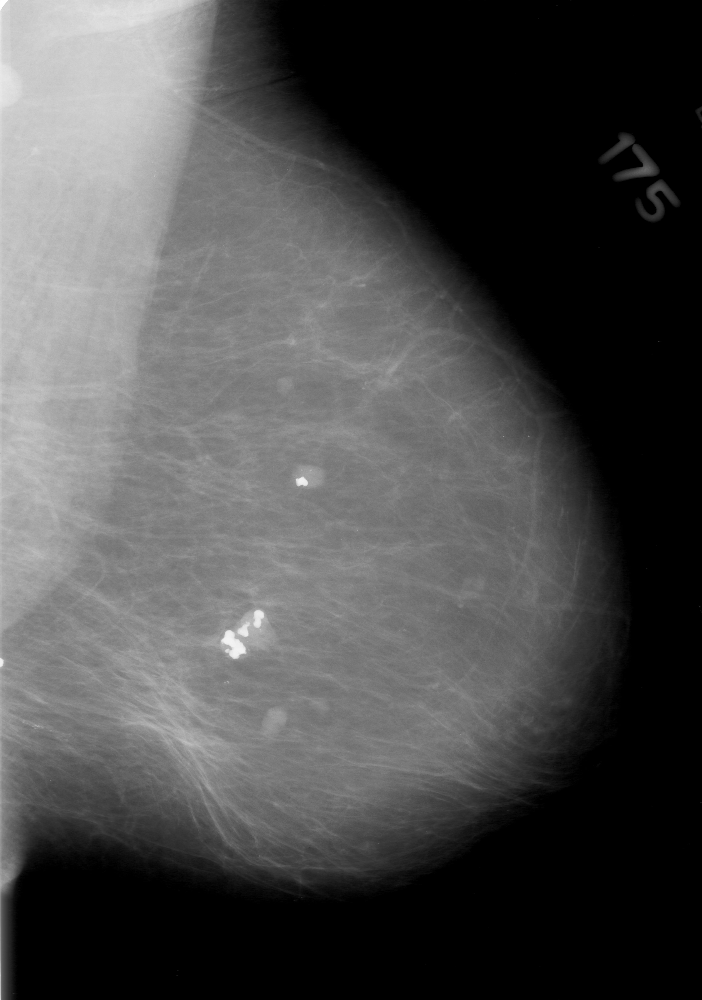

In [9]:
full

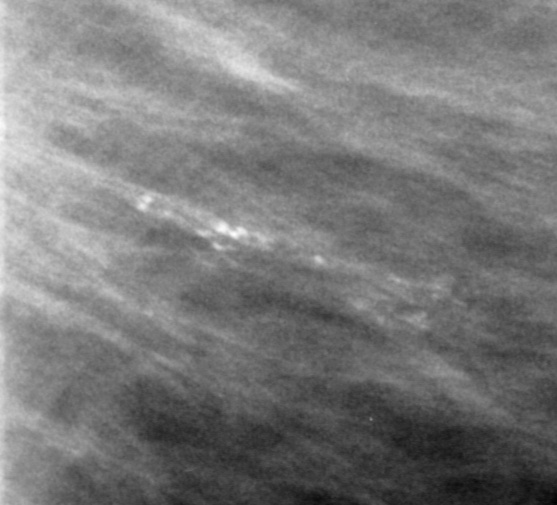

In [10]:
cropped

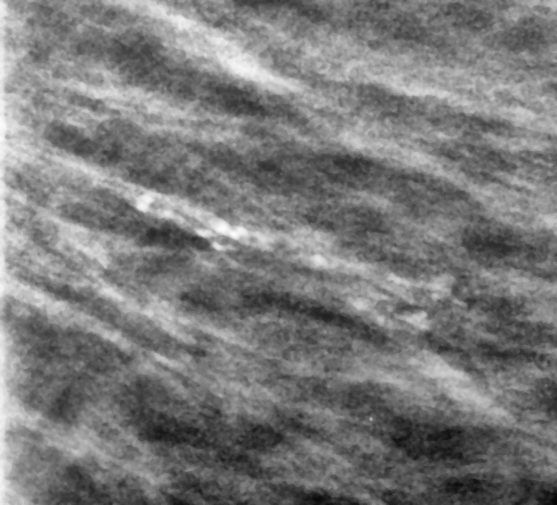

In [11]:
import cv2
# 2. Convert PIL Image to OpenCV/NumPy format
# Grayscale conversion is straightforward:
clip_limit=2
tile_grid_size=(8, 8)
img_np = np.array(cropped, dtype=np.uint8)

# 3. Create a CLAHE object
# 
denoised_np = cv2.medianBlur(img_np, 3)
clahe = cv2.createCLAHE(clipLimit=clip_limit, tileGridSize=tile_grid_size)

# 4. Apply CLAHE directly to the grayscale NumPy array
cl_img_np = clahe.apply(denoised_np)

# 5. Convert the final processed NumPy array back to a PIL Image object
processed_pil_img = Image.fromarray(cl_img_np)
processed_pil_img

In [13]:
CLASS_NAMES_BINARY = [
    'BENIGN', 'MALIGNANT'
]
CLASS_NAMES = [
    'MALIGNANT_PLEOMORPHIC','BENIGN_PLEOMORPHIC',
    'MALIGNANT_Other','BENIGN_Other',
    'BENIGN_AMORPHOUS','BENIGN_PUNCTATE',
    'MALIGNANT_AMORPHOUS','MALIGNANT_PUNCTATE',
    'BENIGN_FINE_LINEAR_BRANCHING', 'MALIGNANT_FINE_LINEAR_BRANCHING',
]


def get_label_from_filename(filename, data):
     current_pathology = data[data["cropped_image_file_path"] == filename]["pathology"].values[0]
     if current_pathology == "MALIGNANT": return 1
     if current_pathology == "BENIGN": return 0
     return -1

def get_calc_type_from_filename(filename, data):
     current_calc_type = data[data["cropped_image_file_path"] == filename]["calc_type"].values[0]
     return current_calc_type

def get_breast_from_filename(filename, data):
     current_breast = data[data["cropped_image_file_path"] == filename]["left_or_right_breast"].values[0]
     return current_breast

def get_calc_distr_from_filename(filename, data):
     current_calc_distr = data[data["cropped_image_file_path"] == filename]["calc_distribution"].values[0]
     return current_calc_distr
    
# def get_calc_type_from_filename(filename, data):
#      current_calc_type = data[data["image_file_path"] == filename]["calc_type"].values[0]
#      return current_calc_type

# def get_breast_from_filename(filename, data):
#      current_breast = data[data["image_file_path"] == filename]["left_or_right_breast"].values[0]
#      return current_breast

# def get_distr_from_filename(filename, data):
#      current_distr = data[data["image_file_path"] == filename]["calc_distribution"].values[0]
#      return current_distr

calc_train_data_dict = {
    'image': [os.path.abspath(f) for f in calc_train_data["cropped_image_file_path"].values if f.startswith("/kaggle/input/")],
    'label': [get_label_from_filename(f, calc_train_data) for f in calc_train_data["cropped_image_file_path"].values if f.startswith("/kaggle/input/")],
    'calc_type': [get_calc_type_from_filename(f, calc_train_data) for f in calc_train_data["cropped_image_file_path"].values if f.startswith("/kaggle/input/")],
    'left_or_right': [get_breast_from_filename(f, calc_train_data) for f in calc_train_data["cropped_image_file_path"].values if f.startswith("/kaggle/input/")],
    'calc_distribution': [get_calc_distr_from_filename(f, calc_train_data) for f in calc_train_data["cropped_image_file_path"].values if f.startswith("/kaggle/input/")]
}
calc_test_data_dict = {
    'image': [os.path.abspath(f) for f in calc_test_data["cropped_image_file_path"].values if f.startswith("/kaggle/input/")],
    'label': [get_label_from_filename(f, calc_test_data) for f in calc_test_data["cropped_image_file_path"].values if f.startswith("/kaggle/input/")],
    'calc_type': [get_calc_type_from_filename(f, calc_test_data) for f in calc_test_data["cropped_image_file_path"].values if f.startswith("/kaggle/input/")],
    'left_or_right': [get_breast_from_filename(f, calc_test_data) for f in calc_test_data["cropped_image_file_path"].values if f.startswith("/kaggle/input/")],
    'calc_distribution': [get_calc_distr_from_filename(f, calc_test_data) for f in calc_test_data["cropped_image_file_path"].values if f.startswith("/kaggle/input/")]

}
features = Features({
    'image': HFImage(),
    'label': ClassLabel(names=CLASS_NAMES),
    'calc_type': Value('string'),
    'left_or_right': Value('string'),
    'calc_distribution': Value('string')
})
calc_train_dataset = Dataset.from_dict(calc_train_data_dict, features=features).cast_column("image", HFImage()).shuffle(seed=42)
calc_test_dataset = Dataset.from_dict(calc_test_data_dict, features=features).cast_column("image", HFImage()).shuffle(seed=42)

calc_train_dataset = calc_train_dataset.train_test_split(test_size=0.1, seed=420)

calc_train_dataset['validation'] = calc_train_dataset.pop('test')

print(calc_train_dataset)
print(calc_test_dataset)

DatasetDict({
    train: Dataset({
        features: ['image', 'label', 'calc_type', 'left_or_right', 'calc_distribution'],
        num_rows: 963
    })
    validation: Dataset({
        features: ['image', 'label', 'calc_type', 'left_or_right', 'calc_distribution'],
        num_rows: 108
    })
})
Dataset({
    features: ['image', 'label', 'calc_type', 'left_or_right', 'calc_distribution'],
    num_rows: 259
})


In [17]:
def preprocess_image(image, clip_limit=2, tile_grid_size=(8, 8)):
    """
    Converts a grayscale PIL Image or a 1-channel NumPy array image to 
    a 3-channel RGB PIL Image by stacking the channels.
    """
    
    # Check if the input is a PIL Image
    if isinstance(image, Image.Image): 
        
        img_np = np.array(image, dtype=np.uint8)
        
        # 1. Denoise image with Median 3x3 filter 
        denoised_np = cv2.medianBlur(img_np, 3)

        # print("apply CLAHE")
        # 2. Apply CLAHE directly to the grayscale NumPy array
        clahe = cv2.createCLAHE(clipLimit=clip_limit, tileGridSize=tile_grid_size)
        cl_img_np = clahe.apply(denoised_np)

        # print("\nresize")
        # 3. Convert the final processed NumPy array back to a PIL Image object
        processed_pil_img = Image.fromarray(cl_img_np)

        # 4. Reshape image to 896x896
        # Image.LANCZOS is used for high-quality downsampling/upsampling
        processed_pil_img = processed_pil_img.resize((896, 896), resample=Image.LANCZOS)
        
        # 5. Transform image to 3 channel RGB
        if processed_pil_img.mode in ('L', 'I', 'I;16'):
            return processed_pil_img.convert("RGB")
        # If it's already RGB/RGBA, just return it
        return processed_pil_img
    
    # Fallback for other formats
    return image

In [18]:
mass_classes = {
    0: "BENIGN",
    1: "MALIGNANT"
}


PROMPT = """Analyze this cropped breast mammographic image containing a calcification and classify it based on its likelihood. Is the calcification benign or malignant?

Note: The most significant features that indicate whether a calcification is benign or malignant are its type and distribution.
Typically benign calcifications include skin, vascular, coarse, large rod-like, round, eggshell, and milk-of-calcium types. Intermediate-concern calcifications are tiny, amorphous, or indistinct. Higher probability of malignancy calcifications can be pleomorphic, heterogeneous, or fine, linear, and/or branching (casting).

Your responses need to be less than 100 tokens and formatted in the following way:

    Analysis:
        - Location: (left or right) breast.
        - Calcification type observed:
        - Calcification distribution pattern:
        Based on these radiological features, the assessment is: (show 0 for benign or 1 for malignant.)
"""

#PROMPT = "Analyze this cropped breast mammographic image. Give an estimation of the probability of the mass being malignant or benign."

def format_data(example):
    """Format examples into the chat-style messages MedGemma expects."""
    example["image"] = preprocess_image(example["image"])
    example["messages"] = [
        {
            "role": "system",
            "content": [{"type": "text", "text": "You are an expert breast radiologist."}]
        },
        {
            "role": "user",
            "content": [
                {"type": "image"},
                {"type": "text", "text": PROMPT},
            ],
        },
        {
            "role": "assistant",
            "content": [
                {
                    "type": "text",
                    "text": f"Analysis:\n\n"
                            f"- Location: {example['left_or_right']} breast\n"
                            f"- Calcification type observed: {example['calc_type']}\n"
                            f"- Calcification distribution pattern: {example['calc_distribution']}\n\n"
                            f"Based on these radiological features, the assessment is: **{example['label']}**"
                },
            ],
        },
    ]
    return example

def format_test_data(example: dict[str, any]) -> dict[str, any]:
    # example["prompt"] = PROMPT
    example["messages"] = [
        {
            "role": "system",
            "content": [{"type": "text", "text": "You are an expert breast radiologist."}]
        },
        {
            "role": "user",
            "content": [
                {"type": "image"},
                {"type": "text", "text": PROMPT},
            ]
        }
    ]
    return example
# Apply formatting
formatted_calc_train_dataset = calc_train_dataset.map(format_data, batched=False, writer_batch_size=300).shuffle(seed=420)
formatted_calc_test_dataset = calc_test_dataset.map(format_test_data, batched=False).shuffle(seed=420)

print("✓ Data formatted with instruction prompts")

Map:   0%|          | 0/963 [00:00<?, ? examples/s]

Map:   0%|          | 0/108 [00:00<?, ? examples/s]

Map:   0%|          | 0/259 [00:00<?, ? examples/s]

✓ Data formatted with instruction prompts


In [19]:
# print(formatted_calc_train_dataset)
import pprint

# Prints the nicely formatted dictionary
# pprint.pprint(formatted_calc_train_dataset["train"][0])

# pprint.pprint(formatted_calc_test_dataset[0])
formatted_calc_test_dataset[35]
formatted_calc_train_dataset["train"][23]

{'image': <PIL.PngImagePlugin.PngImageFile image mode=RGB size=896x896>,
 'label': 1,
 'calc_type': 'FINE_LINEAR_BRANCHING',
 'left_or_right': 'LEFT',
 'calc_distribution': 'CLUSTERED',
 'messages': [{'content': [{'text': 'You are an expert breast radiologist.',
     'type': 'text'}],
   'role': 'system'},
  {'content': [{'text': None, 'type': 'image'},
    {'text': 'Analyze this cropped breast mammographic image containing a calcification and classify it based on its likelihood. Is the calcification benign or malignant?\n\nNote: The most significant features that indicate whether a calcification is benign or malignant are its type and distribution.\nTypically benign calcifications include skin, vascular, coarse, large rod-like, round, eggshell, and milk-of-calcium types. Intermediate-concern calcifications are tiny, amorphous, or indistinct. Higher probability of malignancy calcifications can be pleomorphic, heterogeneous, or fine, linear, and/or branching (casting).\n\nYour responses

## Load base MedGemma 4B model

In [20]:
from transformers import AutoProcessor, AutoModelForImageTextToText, BitsAndBytesConfig
from peft import LoraConfig, get_peft_model

import gc
import torch

# Model ID (Ensure you have access)
model_id = "google/medgemma-4b-it"

# 4-bit quantization config
bnb_config = BitsAndBytesConfig(
    load_in_4bit=True,
    bnb_4bit_quant_type="nf4", # NormalFloat 4 is recommended
    bnb_4bit_compute_dtype=torch.bfloat16,
    bnb_4bit_use_double_quant=True,
)

torch.cuda.empty_cache()
gc.collect()

model = AutoModelForImageTextToText.from_pretrained(
    model_id,
    torch_dtype=torch.bfloat16,
    quantization_config=bnb_config,
    device_map="auto",
    attn_implementation="eager",
)
processor = AutoProcessor.from_pretrained(model_id)

config.json:   0%|          | 0.00/2.47k [00:00<?, ?B/s]

`torch_dtype` is deprecated! Use `dtype` instead!


model.safetensors.index.json:   0%|          | 0.00/90.6k [00:00<?, ?B/s]

Fetching 2 files:   0%|          | 0/2 [00:00<?, ?it/s]

model-00002-of-00002.safetensors:   0%|          | 0.00/3.64G [00:00<?, ?B/s]

model-00001-of-00002.safetensors:   0%|          | 0.00/4.96G [00:00<?, ?B/s]

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

generation_config.json:   0%|          | 0.00/156 [00:00<?, ?B/s]

processor_config.json:   0%|          | 0.00/70.0 [00:00<?, ?B/s]

chat_template.jinja:   0%|          | 0.00/1.53k [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


tokenizer_config.json:   0%|          | 0.00/1.16M [00:00<?, ?B/s]

tokenizer.model:   0%|          | 0.00/4.69M [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/33.4M [00:00<?, ?B/s]

added_tokens.json:   0%|          | 0.00/35.0 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/662 [00:00<?, ?B/s]

## Evaluate baseline model on test data

In [22]:
from IPython.display import display, clear_output

# Helper functions to run evaluation
accuracy_metric = evaluate.load("accuracy")
f1_metric = evaluate.load("f1")
recall = evaluate.load("recall")
precision = evaluate.load("precision")

def compute_metrics(predictions, references):
    return {
        **accuracy_metric.compute(predictions=predictions, references=references),
        **f1_metric.compute(predictions=predictions, references=references, average="weighted"),
        **recall.compute(predictions=predictions, references=references, average="weighted"),
        **precision.compute(predictions=predictions, references=references, average="weighted")
    }

def postprocess_prediction(text):
    """Extract just the number from the model's text output."""
    digit_match = re.search(r'\b([0-9])\b', text.strip())
    
    predicted_digit = int(digit_match.group(1)) if digit_match else -1
    print(f"final prediction: {predicted_digit}")
    final_binary_prediction = 0 if str(predicted_digit) in ["0"] else 1
    
    print(f"final binary prediction {'benign' if final_binary_prediction == 0 else 'malignant'}")    
    return final_binary_prediction

def batch_predict(model, processor, prompts, images, labels, batch_size=1, max_new_tokens=500):
    """A function to run inference in batches."""
    predictions = []
    for i in range(0, len(prompts), batch_size):
               
        batch_texts = prompts[i:i + batch_size]
        label=labels[i:i + batch_size]

        # Clear previous output and display current image
        # clear_output(wait=True)
        
        batch_images = [img for img in images[i:i + batch_size]]
        

        # Logger: show progress
        print(f"\nProcessing batch {i//batch_size + 1} of {((len(prompts) - 1)//batch_size) + 1} "
              f"(indices {i} to {min(i+batch_size-1, len(prompts)-1)})")

        # display(batch_images[0])
        
        batch_texts = processor.apply_chat_template(
            batch_texts, add_generation_prompt=True, tokenize=False, return_tensors="pt"
        )
        
        inputs = processor(text=batch_texts, images=batch_images, padding=True, return_tensors="pt").to("cuda", torch.bfloat16)
        # print(inputs["pixel_values"])
        input_len = inputs["input_ids"].shape[-1]
        
        prompt_lengths = inputs["attention_mask"].sum(dim=1)

        with torch.inference_mode():
            outputs = model.generate(**inputs, max_new_tokens=max_new_tokens, do_sample=False)
            outputs = outputs[0][input_len:]

        decoded = processor.decode(outputs, skip_special_tokens=True)
        print(decoded)
        print(f"Real value: {label}")
        predictions.append(postprocess_prediction(decoded))

    return predictions

[{'content': [{'text': 'You are an expert breast radiologist.', 'type': 'text'}], 'role': 'system'}, {'content': [{'text': None, 'type': 'image'}, {'text': 'Analyze this cropped breast mammographic image containing a calcification and classify it based on its likelihood. Is the calcification benign or malignant?\n\nNote: The most significant features that indicate whether a calcification is benign or malignant are its type and distribution.\nTypically benign calcifications include skin, vascular, coarse, large rod-like, round, eggshell, and milk-of-calcium types. Intermediate-concern calcifications are tiny, amorphous, or indistinct. Higher probability of malignancy calcifications can be pleomorphic, heterogeneous, or fine, linear, and/or branching (casting).\n\nYour responses need to be less than 100 tokens and formatted in the following way:\n\n    Analysis:\n        - Location: (left or right) breast.\n        - Calcification type observed:\n        - Calcification distribution patt

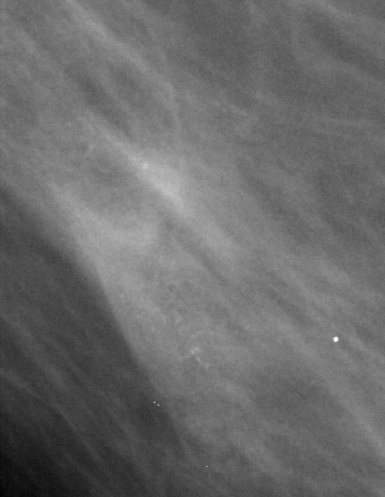

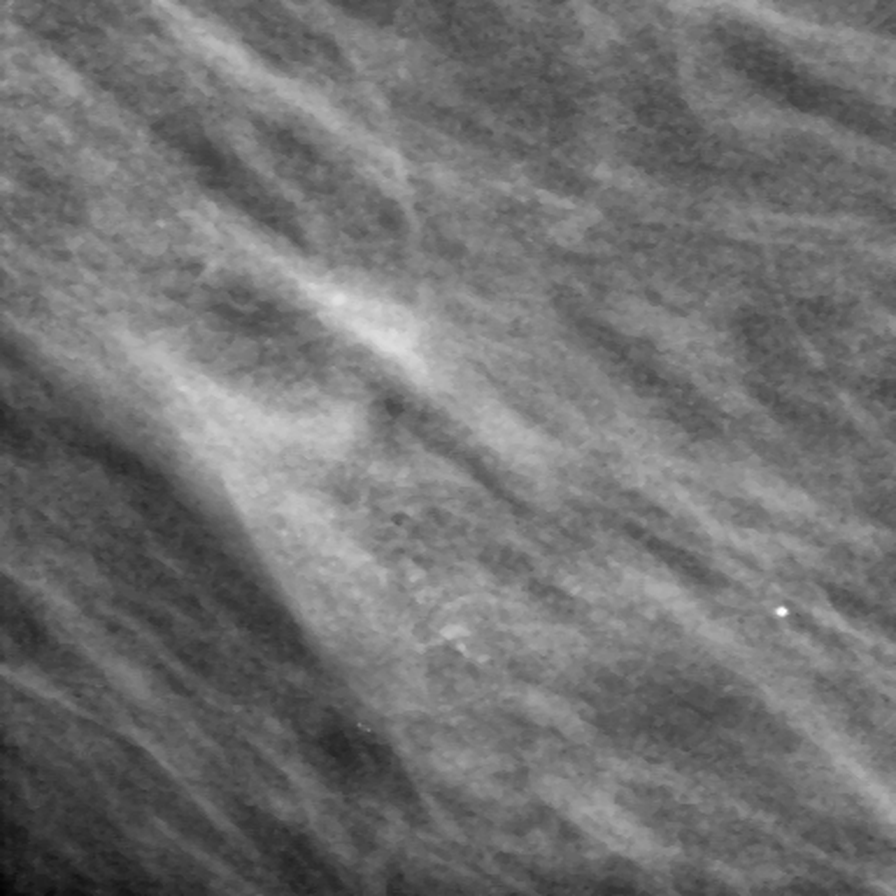



0: BENIGN




In [23]:
calc_classes = {
    0: "BENIGN",
    1: "MALIGNANT"
}

# Prepare data for evaluation
eval_prompts = [prompt for prompt in formatted_calc_test_dataset["messages"]]

# Apply the conversion to every image in your dataset list
eval_images = [preprocess_image(img) for img in formatted_calc_test_dataset["image"]]
eval_labels = formatted_calc_test_dataset["label"]



print(eval_prompts[0])
print("\n")
display(formatted_calc_test_dataset["image"][0])
display(eval_images[0])
print("\n")
print(f"{str(eval_labels[0])}: {calc_classes.get(eval_labels[0])}")
print("\n")

In [24]:
# Run baseline evaluation
print("Running baseline evaluation...")
baseline_preds = batch_predict(model, processor, eval_prompts, eval_images, eval_labels)
baseline_metrics = compute_metrics(baseline_preds, eval_labels)

Running baseline evaluation...

Processing batch 1 of 259 (indices 0 to 0)
Analysis:
- Location: Right breast.
- Calcification type observed: A calcification is visible.
- Calcification distribution pattern: The calcification appears to be a single, round calcification.
Based on these radiological features, the assessment is: 0

Real value: [0]
final prediction: 0
final binary prediction benign

Processing batch 2 of 259 (indices 1 to 1)
Analysis:
- Location: right breast.
- Calcification type observed: calcification.
- Calcification distribution pattern: single.
Based on these radiological features, the assessment is: 0

Real value: [0]
final prediction: 0
final binary prediction benign

Processing batch 3 of 259 (indices 2 to 2)
Analysis:
- Location: right breast.
- Calcification type observed: calcification.
- Calcification distribution pattern: single.
Based on these radiological features, the assessment is: 0

Real value: [0]
final prediction: 0
final binary prediction benign

Pro


--------------------------------BASELINE RESULTS--------------------------------
Accuracy: 49.8%
F1 Score: 0.334
Recall: 0.498
Precision: 0.251
--------------------------------------------------------------------------------


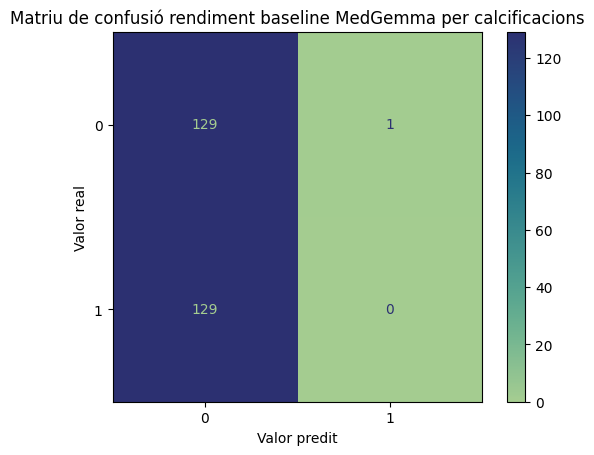

In [26]:
print(f"\n{'BASELINE RESULTS':-^80}")
print(f"Accuracy: {baseline_metrics['accuracy']:.1%}")
print(f"F1 Score: {baseline_metrics['f1']:.3f}")
print(f"Recall: {baseline_metrics['recall']:.3f}")
print(f"Precision: {baseline_metrics['precision']:.3f}")
print("-" * 80)

from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

cm = confusion_matrix(eval_labels, baseline_preds)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap = "crest")
disp.ax_.set_title("Matriu de confusió rendiment baseline MedGemma per calcificacions")
disp.ax_.set_xlabel("Valor predit")
disp.ax_.set_ylabel("Valor real")
plt.show()

In [27]:
gc.collect()
torch.cuda.empty_cache()

from trl import SFTConfig, SFTTrainer
# Use right padding to avoid issues during training
processor.tokenizer.padding_side = "right"

# LoRA Configuration
peft_config = LoraConfig(
    r=8,
    lora_alpha=16,
    lora_dropout=0.1,
    bias="none",
    target_modules="all-linear",
    task_type="CAUSAL_LM",
)

# Custom data collator to handle images and text
def collate_fn(examples):
    texts, images = [], []
    for example in examples:
        images.append([example["image"]])
        texts.append(processor.apply_chat_template(example["messages"], add_generation_prompt=False, tokenize=False).strip())
    batch = processor(text=texts, images=images, return_tensors="pt", padding=True)
    labels = batch["input_ids"].clone()
    labels[labels == processor.tokenizer.pad_token_id] = -100
    image_token_id = processor.tokenizer.convert_tokens_to_ids(processor.tokenizer.special_tokens_map["boi_token"])
    labels[labels == image_token_id] = -100
    labels[labels == 262144] = -100
    batch["labels"] = labels
    return batch


args = SFTConfig(
    output_dir="medgemma-mammography-calc",            # Directory and Hub repository id to save the model to
    num_train_epochs=1,                       # Number of training epochs
    per_device_train_batch_size=1,                           # Batch size per device during training
    per_device_eval_batch_size=1,                            # Batch size per device during evaluation
    gradient_accumulation_steps=32,                           # Number of steps before performing a backward/update pass
    gradient_checkpointing=True,                             # Enable gradient checkpointing to reduce memory usage
    optim="adamw_torch_fused",                               # Use fused AdamW optimizer for better performance
    logging_steps=0.2,                                        # Number of steps between logs
    save_strategy="epoch",                                   # Save checkpoint every epoch
    eval_strategy="steps",                                   # Evaluate every `eval_steps`
    eval_steps=0.2,                                           # Number of steps between evaluations
    learning_rate=5e-5,                             # Learning rate based on QLoRA paper
    bf16=True,                                               # Use bfloat16 precision
    max_grad_norm=0.3,                                       # Max gradient norm based on QLoRA paper
    warmup_ratio=0.05,                                       # Warmup ratio based on QLoRA paper
    lr_scheduler_type="linear",                              # Use linear learning rate scheduler
    push_to_hub=False,                                        # Push model to Hub
    report_to="none",                                 # Report metrics to tensorboard
    gradient_checkpointing_kwargs={"use_reentrant": False},  # Set gradient checkpointing to non-reentrant to avoid issues
    dataset_kwargs={"skip_prepare_dataset": True},           # Skip default dataset preparation to preprocess manually
    remove_unused_columns = False,                           # Columns are unused for training but needed for data collator
    label_names=["labels"],                                  # Input keys that correspond to the labels
)

# Initialize and run the trainer
trainer = SFTTrainer(
    model=model,
    args=args,
    train_dataset=formatted_calc_train_dataset["train"],
    eval_dataset=formatted_calc_train_dataset["validation"].shuffle(seed=42),
    peft_config=peft_config,
    processing_class=processor,
    data_collator=collate_fn,
)

print("Starting training...")
trainer.train()

/usr/local/lib/python3.11/dist-packages/pydantic/_internal/_generate_schema.py:2249: UnsupportedFieldAttributeWarning: The 'repr' attribute with value False was provided to the `Field()` function, which has no effect in the context it was used. 'repr' is field-specific metadata, and can only be attached to a model field using `Annotated` metadata or by assignment. This may have happened because an `Annotated` type alias using the `type` statement was used, or if the `Field()` function was attached to a single member of a union type.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/pydantic/_internal/_generate_schema.py:2249: UnsupportedFieldAttributeWarning: The 'frozen' attribute with value True was provided to the `Field()` function, which has no effect in the context it was used. 'frozen' is field-specific metadata, and can only be attached to a model field using `Annotated` metadata or by assignment. This may have happened because an `Annotated` type alias using the `type` 

Starting training...


Step,Training Loss,Validation Loss
7,3.352500,2.964552
14,2.718500,2.429286
21,2.270200,2.094499
28,2.003900,1.931013


TrainOutput(global_step=31, training_loss=2.5216836467865975, metrics={'train_runtime': 10578.5598, 'train_samples_per_second': 0.091, 'train_steps_per_second': 0.003, 'total_flos': 1.0910135436876288e+16, 'train_loss': 2.5216836467865975})

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to 

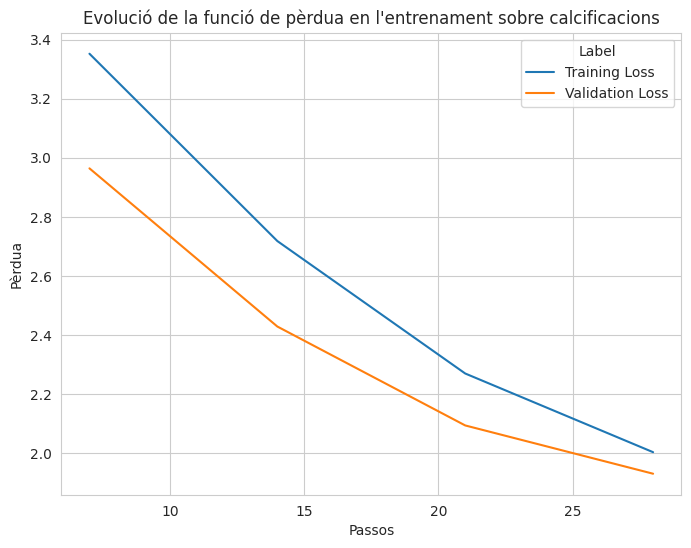

In [28]:
data = {
    "Step": [7, 14, 21, 28],
    "Training Loss": [
        3.3525, 2.7185, 2.2702, 2.0039,
    ],
    "Validation Loss": [
        2.9645, 2.4292, 2.0944, 1.9310,
    ]
}

training_metrics = pd.DataFrame(data)
# Convert to long format
training_metrics = training_metrics.melt(
    id_vars="Step",
    value_vars=["Training Loss", "Validation Loss"],
    var_name="Label",
    value_name="Loss"
)

sns.set_style("whitegrid")
plt.figure(figsize=(8,6))
ax = sns.lineplot(data=training_metrics, x="Step", y="Loss", hue="Label")
ax.set(xlabel="Passos", ylabel='Pèrdua', title = "Evolució de la funció de pèrdua en l'entrenament sobre calcificacions")
plt.show()

In [29]:
from transformers import AutoProcessor, AutoModelForImageTextToText, BitsAndBytesConfig
from peft import LoraConfig, get_peft_model, PeftModel

import gc
import torch
# Clear memory and load the final model
del model
torch.cuda.empty_cache()
gc.collect()

MODEL_ID = "google/medgemma-4b-it"

# Load base model
base_model = AutoModelForImageTextToText.from_pretrained(
    MODEL_ID,
    torch_dtype=torch.bfloat16,
    device_map="auto",
)

# Load LoRA adapters and merge them
finetuned_model = PeftModel.from_pretrained(base_model, "/kaggle/working/medgemma-mammography-calc/checkpoint-31")
finetuned_model = finetuned_model.merge_and_unload()

# Load processor from fine-tuned checkpoint
processor_finetuned = AutoProcessor.from_pretrained("/kaggle/working/medgemma-mammography-calc/checkpoint-31")
processor_finetuned.tokenizer.padding_side = "left" # for inference set left

# Configure for generation
finetuned_model.generation_config.do_sample = True
finetuned_model.generation_config.max_new_tokens = 256
finetuned_model.generation_config.pad_token_id = processor_finetuned.tokenizer.pad_token_id
finetuned_model.config.pad_token_id = processor_finetuned.tokenizer.pad_token_id

print("✓ Fine-tuned model loaded")

# Run evaluation
print("Running fine-tuned evaluation...")
finetuned_preds = batch_predict(finetuned_model, processor_finetuned, eval_prompts, eval_images, eval_labels)
finetuned_metrics = compute_metrics(finetuned_preds, eval_labels)

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

✓ Fine-tuned model loaded
Running fine-tuned evaluation...

Processing batch 1 of 259 (indices 0 to 0)
Analysis:
- Location: Right breast
- Calcification type observed: Pleomorphic
- Calcification distribution pattern: Scattered

Based on these radiological features, the assessment is: 0

Real value: [0]
final prediction: 0
final binary prediction benign

Processing batch 2 of 259 (indices 1 to 1)
Analysis:

- Location: Right breast
- Calcification type observed: Pleomorphic
- Calcification distribution pattern: Linear

Based on these radiological features, the assessment is: 1

Real value: [0]
final prediction: 1
final binary prediction malignant

Processing batch 3 of 259 (indices 2 to 2)
Analysis:
- Location: Right breast
- Calcification type observed: Pleomorphic
- Calcification distribution pattern: Linear

Based on these radiological features, the assessment is: 1

Real value: [0]
final prediction: 1
final binary prediction malignant

Processing batch 4 of 259 (indices 3 to 3)
An


-------------------------------FINE-TUNED RESULTS-------------------------------
Accuracy: 44.8%
F1 Score: 0.420
Recall: 0.448
Precision: 0.437
--------------------------------------------------------------------------------


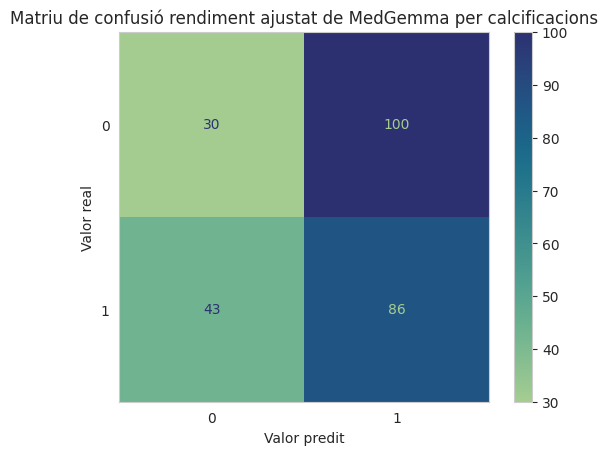

In [31]:
print(f"\n{'FINE-TUNED RESULTS':-^80}")
print(f"Accuracy: {finetuned_metrics['accuracy']:.1%}")
print(f"F1 Score: {finetuned_metrics['f1']:.3f}")
print(f"Recall: {finetuned_metrics['recall']:.3f}")
print(f"Precision: {finetuned_metrics['precision']:.3f}")
print("-" * 80)

from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
sns.set_style("whitegrid")

cm = confusion_matrix(eval_labels, finetuned_preds)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)

disp.plot(cmap = "crest")
disp.ax_.grid(False)
disp.ax_.set_title("Matriu de confusió rendiment ajustat de MedGemma per calcificacions")
disp.ax_.set_xlabel("Valor predit")
disp.ax_.set_ylabel("Valor real")
plt.show()